# Analyse des données d'accidents - csv caract

Nous analysons les données afin de déterminer les facteurs d'accidents graves

In [33]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

In [34]:
#Récupération des fichiers en csv
df_caract = pd.read_csv("datas/caract-2023.csv", encoding = 'utf-8', delimiter=";")
df_lieux = pd.read_csv("datas/lieux-2023.csv", encoding = 'utf-8', delimiter=";", low_memory=False)
df_usagers = pd.read_csv("datas/usagers-2023.csv", encoding = 'utf-8', delimiter=";")
df_vehicules = pd.read_csv("datas/vehicules-2023.csv", encoding = 'utf-8', delimiter=";")

In [35]:
df_caract.head()

,Num_Acc,jour,mois,an,hrmn,lum,dep,com,agg,int,atm,col,adr,lat,long
0,202300000001,7,5,2023,06:00,1,75,75101,2,4,2,7,RUE DE RIVOLI,"48,86638600","2,32347100"
1,202300000002,7,5,2023,05:30,5,94,94080,2,1,3,6,Avenue de Paris,"48,84547782","2,42868146"
2,202300000003,7,5,2023,20:50,1,94,94022,2,3,2,1,Avenue du Général Leclerc,"48,76240000","2,40655000"
3,202300000004,6,5,2023,23:57,5,94,94078,2,1,3,5,Rue de Paris,"48,73248432","2,44687575"
4,202300000005,7,5,2023,00:50,5,94,94068,2,2,3,3,56bis Avenue Raspail,"48,78581000","2,49217000"


In [36]:
print(len(df_caract.columns))
print(df_caract.shape)
df_caract.info()

15
(54822, 15)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54822 entries, 0 to 54821
Data columns (total 15 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Num_Acc  54822 non-null  int64 
 1   jour     54822 non-null  int64 
 2   mois     54822 non-null  int64 
 3   an       54822 non-null  int64 
 4   hrmn     54822 non-null  object
 5   lum      54822 non-null  int64 
 6   dep      54822 non-null  object
 7   com      54822 non-null  object
 8   agg      54822 non-null  int64 
 9   int      54822 non-null  int64 
 10  atm      54822 non-null  int64 
 11  col      54822 non-null  int64 
 12  adr      53433 non-null  object
 13  lat      54822 non-null  object
 14  long     54822 non-null  object
dtypes: int64(9), object(6)
memory usage: 6.3+ MB


In [37]:
df_caract.isna().sum()

Num_Acc       0
jour          0
mois          0
an            0
hrmn          0
lum           0
dep           0
com           0
agg           0
int           0
atm           0
col           0
adr        1389
lat           0
long          0
dtype: int64

In [38]:
df_caract.isna().sum().sum()

1389

In [39]:
df_caract.columns

Index(['Num_Acc', 'jour', 'mois', 'an', 'hrmn', 'lum', 'dep', 'com', 'agg',
       'int', 'atm', 'col', 'adr', 'lat', 'long'],
      dtype='object')

In [40]:
for column in df_caract.select_dtypes(include=['number']).columns:
    print(f"{column} min : {df_caract[column].min()}, max : {df_caract[column].max()}")

Num_Acc min : 202300000001, max : 202300054822
jour min : 1, max : 31
mois min : 1, max : 12
an min : 2023, max : 2023
lum min : -1, max : 5
agg min : 1, max : 2
int min : -1, max : 9
atm min : -1, max : 9
col min : -1, max : 7


In [41]:
fig = px.box(df_caract, y=[df_caract['lum'], df_caract['agg'], df_caract['int'], df_caract['atm'], df_caract['col']] , points = "outliers")
fig.show()

In [42]:
df_caract['lum'].value_counts(normalize=True)
# éclairé, non éclairé (regroupe 3 et 4)

 1    0.658805
 5    0.155011
 3    0.107858
 2    0.066451
 4    0.011838
-1    0.000036
Name: lum, dtype: float64

In [43]:
df_caract['int'].value_counts(normalize=True)
# hors intersection et le reste intersection

 1    0.635548
 2    0.122998
 3    0.115994
 9    0.045401
 6    0.044508
 4    0.019974
 7    0.007570
 5    0.005326
 8    0.002572
-1    0.000109
Name: int, dtype: float64

In [44]:
df_caract['atm'].value_counts(normalize=True)
# normal ou degradé

 1    0.779742
 2    0.120937
 8    0.040732
 3    0.027452
 7    0.017402
 5    0.004360
 9    0.003794
 6    0.003375
 4    0.002134
-1    0.000073
Name: atm, dtype: float64

In [45]:
df_caract['col'].value_counts(normalize=True)
# collision avec véhicule, autre collision ou sans collision

 6    0.303254
 3    0.298712
 2    0.132593
 1    0.107129
 7    0.094816
 4    0.033618
 5    0.029641
-1    0.000237
Name: col, dtype: float64

In [46]:
df_caract_int = df_caract[(df_caract['int']>=1) & (df_caract['int']<=3)]
len(df_caract_int)

47944

In [47]:
df_caract_atm = df_caract[(df_caract['atm']==1)]
len(df_caract_atm)

42747

In [48]:
df_caract_abber = df_caract[(df_caract['int']>=1) & (df_caract['int']<=3) & (df_caract['atm']==1)]
len(df_caract_abber)

37481

In [49]:
print("lum = ", df_caract["lum"].value_counts())
print("agg = ", df_caract["agg"].value_counts())
print("int = ", df_caract["int"].value_counts())
print("atm = ", df_caract["atm"].value_counts())
print("col = ", df_caract["col"].value_counts())

lum =   1    36117
 5     8498
 3     5913
 2     3643
 4      649
-1        2
Name: lum, dtype: int64
agg =  2    34326
1    20496
Name: agg, dtype: int64
int =   1    34842
 2     6743
 3     6359
 9     2489
 6     2440
 4     1095
 7      415
 5      292
 8      141
-1        6
Name: int, dtype: int64
atm =   1    42747
 2     6630
 8     2233
 3     1505
 7      954
 5      239
 9      208
 6      185
 4      117
-1        4
Name: atm, dtype: int64
col =   6    16625
 3    16376
 2     7269
 1     5873
 7     5198
 4     1843
 5     1625
-1       13
Name: col, dtype: int64


/tmp/ipykernel_55368/1982236399.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<Axes: >

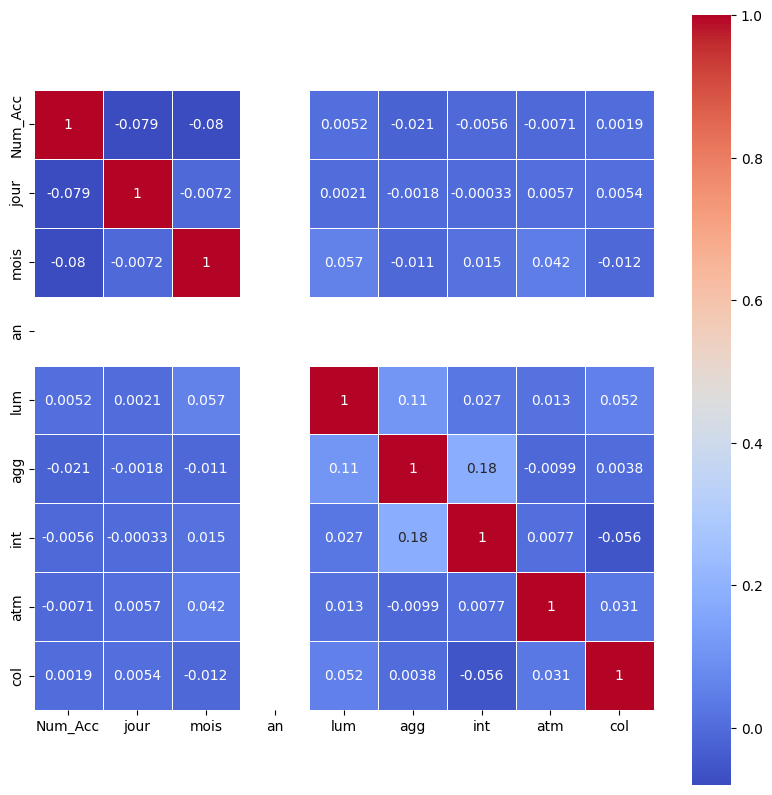

In [50]:
cor = df_caract.corr()

plt.subplots(figsize=(10,10))
sns.heatmap(cor, square=True, cmap="coolwarm", linewidths=0.5, annot=True)

In [51]:
df_caract.describe()

,Num_Acc,jour,mois,an,lum,agg,int,atm,col
count,5.482200e+04,54822.000000,54822.000000,54822.0,54822.000000,54822.000000,54822.000000,54822.000000,54822.000000
mean,2.023000e+11,15.396629,6.744628,2023.0,1.937653,1.626135,2.085167,1.636296,4.034129
std,1.582589e+04,8.705039,3.368853,0.0,1.485124,0.483833,2.022823,1.692539,1.973341
min,2.023000e+11,1.000000,1.000000,2023.0,-1.000000,1.000000,-1.000000,-1.000000,-1.000000
25%,2.023000e+11,8.000000,4.000000,2023.0,1.000000,1.000000,1.000000,1.000000,3.000000
50%,2.023000e+11,15.000000,7.000000,2023.0,1.000000,2.000000,1.000000,1.000000,3.000000
75%,2.023000e+11,23.000000,10.000000,2023.0,3.000000,2.000000,2.000000,1.000000,6.000000
max,2.023001e+11,31.000000,12.000000,2023.0,5.000000,2.000000,9.000000,9.000000,7.000000


### Analyse caract
- Dans le df_caract, il y a 54822,  et 15 colonnes.<br/>
- Il y a 9 colonnes numériques (int64) et 6 colonnes object.<br/>
hrmn correspond à l'heure de l'accident -> 1409 uniques<br/>
dep sont des numéros de département -> 107 uniques<br/>
com est le numéro de commune code INSEE-> 11311 uniques<br/>
adr, lat et long sont adresse, latitude et longitude -> uniques = 29081 adresses, 52905 lat, 53148 long<br/>
<br/>
- 1389 valeurs manquantes dans la colonne adr


### Analyse des données numériques
- Lumière -> 65% : plein jour, 15% : Nuit avec éclairage public allumé<br/>
- Agglomération : agglo = 34326 (62%), hors agglo = 20496 (37%)<br/>
- Intersection -> 63% : hors intersection, 12% : intersection en X, 11% : intersection en T<br/>
- Conditions atmosphériques -> 77% : normale, 12% : pluie légère, 4% : temps couvert<br/>
- Type de collision -> 30% : autre collision, 29% : 2 véhicules par le côté, 13% : 2 véhicules par l'arrière<br/>

### Valeurs aberrantes
Pour int, toutes celles au dessus de 3 et en dessous de 1 pour un total de 54822-47994 = 6828<br/>
Pour atm, toutes celles différentes de 1 pour un total de 54822-42747 = 12075<br/>
Le total de données sans valeurs abberrantes est de 37481

### Colonnes à conserver + catégories :
lum -> éclairé, non éclairé<br/>
agg ->on ne touche pas<br/>
int -> intersection, hors intersection<br/>
atm-> normal, dégradé<br/>
col - collision avec véhicule, autre collision ou sans collision

## Catégorisation caract

In [52]:
df_caract.columns

Index(['Num_Acc', 'jour', 'mois', 'an', 'hrmn', 'lum', 'dep', 'com', 'agg',
       'int', 'atm', 'col', 'adr', 'lat', 'long'],
      dtype='object')

In [53]:
new_df_caract = df_caract.drop(columns=['jour', 'mois', 'an', 'hrmn', 'dep', 'com', 'adr', 'lat', 'long'])

In [54]:
new_df_caract.head()

,Num_Acc,lum,agg,int,atm,col
0,202300000001,1,2,4,2,7
1,202300000002,5,2,1,3,6
2,202300000003,1,2,3,2,1
3,202300000004,5,2,1,3,5
4,202300000005,5,2,2,3,3


In [55]:
def categorize_lum(valeur):
    if valeur in [1,2,5]:
        return 'éclairé'
    elif valeur in [3,4]:
        return 'non éclairé'

new_df_caract['luminosité'] = new_df_caract['lum'].apply(categorize_lum)

In [56]:
def categorize_int(valeur):
    if valeur in [2,3,4,5,6,7,8,9,]:
        return 'intersection'
    elif valeur in [1]:
        return 'hors intersection'

new_df_caract['intersection']= new_df_caract['int'].apply(categorize_int)

In [57]:
def categorize_atm(valeur):
    if valeur in [1]:
        return 'normal'
    else :
        return 'dégradé'
    
new_df_caract['atm_condition'] = new_df_caract['atm'].apply(categorize_atm)

In [58]:
def categorize_col(valeur):
    if valeur in [1, 2, 3, 4, 5] :
        return 'avec vehicule'
    elif valeur in [-1, 6] :
        return 'autre'
    elif valeur in [7] : 
        return 'sans vehicule'
    
new_df_caract['collision'] = new_df_caract['col'].apply(categorize_col)

In [59]:
def categorize_agg(valeur):
    if valeur == 1:
        return 'hors agglomération'
    elif valeur == 2:
        return 'agglomération'

new_df_caract['agglomération'] = new_df_caract['agg'].apply(categorize_agg)

In [60]:
new_df_caract = new_df_caract.drop(columns=['lum', 'agg', 'int', 'atm', 'col'])

In [61]:
new_df_caract.head(20)

,Num_Acc,luminosité,intersection,atm_condition,collision,agglomération
0,202300000001,éclairé,intersection,dégradé,sans vehicule,agglomération
1,202300000002,éclairé,hors intersection,dégradé,autre,agglomération
2,202300000003,éclairé,intersection,dégradé,avec vehicule,agglomération
3,202300000004,éclairé,hors intersection,dégradé,avec vehicule,agglomération
4,202300000005,éclairé,intersection,dégradé,avec vehicule,agglomération
5,202300000006,éclairé,intersection,dégradé,autre,agglomération
6,202300000007,éclairé,hors intersection,dégradé,avec vehicule,agglomération
7,202300000008,éclairé,intersection,dégradé,avec vehicule,agglomération
8,202300000009,éclairé,intersection,dégradé,avec vehicule,agglomération
9,202300000010,éclairé,hors intersection,dégradé,autre,agglomération


In [62]:
new_df_caract.shape

(54822, 6)

In [63]:
print("luminosité = ", new_df_caract['luminosité'].value_counts(normalize=True))
print('----------------------------------------------------------------')
print("intersection = ", new_df_caract['intersection'].value_counts(normalize=True))
print('----------------------------------------------------------------')
print("atm_condition = ", new_df_caract['atm_condition'].value_counts(normalize=True))
print('----------------------------------------------------------------')
print("collision = ", new_df_caract['collision'].value_counts(normalize=True))
print('----------------------------------------------------------------')
print("agglomération = ", new_df_caract['agglomération'].value_counts(normalize=True))

luminosité =  éclairé        0.880299
non éclairé    0.119701
Name: luminosité, dtype: float64
----------------------------------------------------------------
intersection =  hors intersection    0.635617
intersection         0.364383
Name: intersection, dtype: float64
----------------------------------------------------------------
atm_condition =  normal     0.779742
dégradé    0.220258
Name: atm_condition, dtype: float64
----------------------------------------------------------------
collision =  avec vehicule    0.601693
autre            0.303491
sans vehicule    0.094816
Name: collision, dtype: float64
----------------------------------------------------------------
agglomération =  agglomération         0.626135
hors agglomération    0.373865
Name: agglomération, dtype: float64


In [64]:
new_df_caract.to_csv("caract_clean.csv", index=False)